In [ ]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.utils import make_grid
from torchvision.datasets import CelebA
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import torch.nn.functional as F

In [ ]:
from google.colab import drive

drive.mount('/content/gdrive/', force_remount=True)

Mounted at /content/gdrive/


In [ ]:
from pydrive.auth import GoogleAuth
from google.colab import drive
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

In [ ]:
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

file_id = '157bjO1_cFuSd0HWDUuAmcHRJDVyWpOxB' 


download = drive.CreateFile({'id': file_id})


# Download the file to a local disc
download.GetContentFile('LOL.zip')

In [ ]:
!unzip /content/LOL.zip -d /content/LOL

Archive:  /content/LOL.zip
   creating: /content/LOL/eval15/
   creating: /content/LOL/eval15/high/
  inflating: /content/LOL/eval15/high/748.png  
   creating: /content/LOL/__MACOSX/
   creating: /content/LOL/__MACOSX/eval15/
   creating: /content/LOL/__MACOSX/eval15/high/
  inflating: /content/LOL/__MACOSX/eval15/high/._748.png  
  inflating: /content/LOL/eval15/high/665.png  
  inflating: /content/LOL/__MACOSX/eval15/high/._665.png  
  inflating: /content/LOL/eval15/high/111.png  
  inflating: /content/LOL/__MACOSX/eval15/high/._111.png  
  inflating: /content/LOL/eval15/high/493.png  
  inflating: /content/LOL/__MACOSX/eval15/high/._493.png  
  inflating: /content/LOL/eval15/high/22.png  
  inflating: /content/LOL/__MACOSX/eval15/high/._22.png  
  inflating: /content/LOL/eval15/high/23.png  
  inflating: /content/LOL/__MACOSX/eval15/high/._23.png  
  inflating: /content/LOL/eval15/high/669.png  
  inflating: /content/LOL/__MACOSX/eval15/high/._669.png  
  inflating: /content/LOL/ev

In [ ]:
class Residual_block(nn.Module):
    def __init__(self, channels):
        super().__init__()

        self.layers = nn.Sequential(
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels),
            nn.PReLU(),

            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels),
        )

    def forward(self, x):
        return x + self.layers(x)


In [ ]:
class Generator(nn.Module):
  def __init__(self,channels=64):
    super(Generator,self).__init__()
    self.Gen=nn.Sequential(nn.Conv2d(3,channels,kernel_size=9,padding=1),
                           nn.BatchNorm2d(channels),
                           nn.PReLU())
    res_block=[]
    for i in range(2):
      res_block+=[Residual_block(channels)]
    self.res=nn.Sequential(*res_block)
    self.out=nn.Sequential(nn.Conv2d(channels,3,kernel_size=3,padding=1),
                           )
    ps_blocks = []
    for _ in range(2):
            ps_blocks += [
                nn.Conv2d(channels, 4 *channels, kernel_size=3, padding=1),
                nn.PixelShuffle(2),
                nn.PReLU(),
            ]
    self.ps_blocks = nn.Sequential(*ps_blocks)
    self.cn=nn.Conv2d(64,64*2,kernel_size=3,padding=1)
    self.cn1=nn.Conv2d(64*2,64,kernel_size=3,padding=7)
    self.pool=nn.MaxPool2d(2)

  def forward(self,x):
      x1=self.Gen(x)
      x2=x1+self.res(x1)
      x3=self.ps_blocks(x2)
      x4=self.cn(x3)
      
      x5=self.pool(x4)
      x6=self.cn1(x5)
      x7=self.pool(x6)

    
      x8=x+self.out(x7)
      return x8

In [ ]:
model=Generator().to('cuda')

In [ ]:

from torchsummary import summary

summary(model, (3, 64, 64))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 58, 58]          15,616
       BatchNorm2d-2           [-1, 64, 58, 58]             128
             PReLU-3           [-1, 64, 58, 58]               1
            Conv2d-4           [-1, 64, 58, 58]          36,928
       BatchNorm2d-5           [-1, 64, 58, 58]             128
             PReLU-6           [-1, 64, 58, 58]               1
            Conv2d-7           [-1, 64, 58, 58]          36,928
       BatchNorm2d-8           [-1, 64, 58, 58]             128
    Residual_block-9           [-1, 64, 58, 58]               0
           Conv2d-10           [-1, 64, 58, 58]          36,928
      BatchNorm2d-11           [-1, 64, 58, 58]             128
            PReLU-12           [-1, 64, 58, 58]               1
           Conv2d-13           [-1, 64, 58, 58]          36,928
      BatchNorm2d-14           [-1, 64,

In [ ]:
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder

In [ ]:
import os
from torch.utils.data import Dataset, DataLoader
from PIL import  Image
import numpy as np
import glob
data_transforms=transforms.Compose([
                                    transforms.ToTensor(),
                                    transforms.Resize((64*2,64*2),antialias=True),
                                    
                                    ])
class Data(Dataset):
    def __init__(self, hpath,lpath):
        self.hpath =hpath
        self.lpath =lpath
        self.list_filesh = glob.glob(hpath+'/*.png')
        self.list_filesl = glob.glob(lpath+'/*.png')
            
    def __len__(self):
        return len(self.list_filesh)
     
    def __getitem__(self, index):
        high_file = self.list_filesh[index]
        low_file=self.list_filesl[index]
        himage = np.array(Image.open(high_file))
        limage=np.array(Image.open(low_file))
        h_image=data_transforms(himage)
        l_image=data_transforms(limage)
        return h_image, l_image

In [ ]:
dataset=Data('/content/LOL/our485/high','/content/LOL/our485/low')


In [ ]:
dataloader = DataLoader(dataset, batch_size=4*4, shuffle=False)

In [ ]:
model=Generator()
device='cuda'

In [ ]:
import torch
import torch.nn.functional as F
from torchvision.models import vgg19
class PerceptualLoss(torch.nn.Module):
      def __init__(self, device='cuda'):
        super().__init__()

        vgg = vgg19(pretrained=True).to(device)
        self.vgg = nn.Sequential(*list(vgg.features)[:-1]).eval()
        for p in self.vgg.parameters():
            p.requires_grad = False
      def forward(self, x_real, x_fake):
        return F.mse_loss(self.vgg(x_real), self.vgg(x_fake))

  0%|          | 0/31 [00:00<?, ?it/s]

/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth

  0%|          | 0.00/548M [00:00<?, ?B/s]
  1%|          | 5.61M/548M [00:00<00:10, 56.2MB/s]
  2%|▏         | 11.9M/548M [00:00<00:09, 60.8MB/s]
  5%|▍         | 26.8M/548M [00:00<00:05, 102MB/s] 
  7%|▋         | 36.6M/548M [00:00<00:05, 99.0MB/s]
  8%|▊

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

Step 100: loss: 0.28060


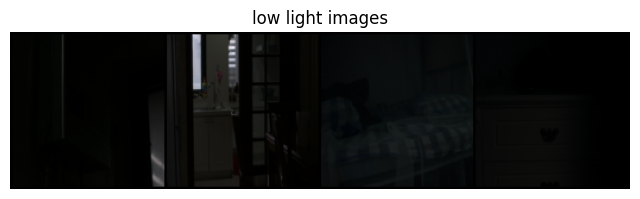

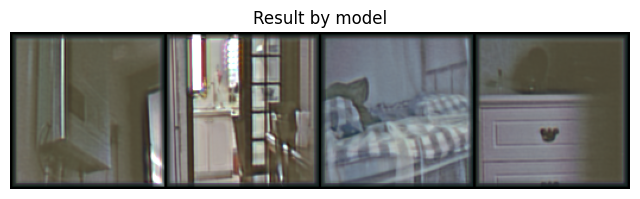

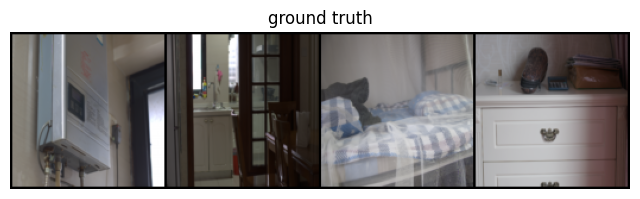

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

Step 200: loss: 0.20953


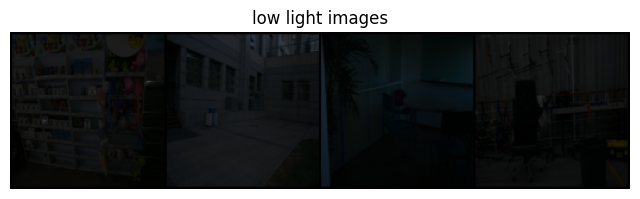

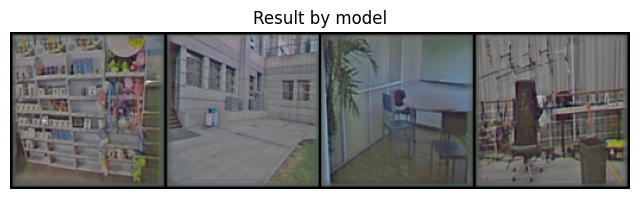

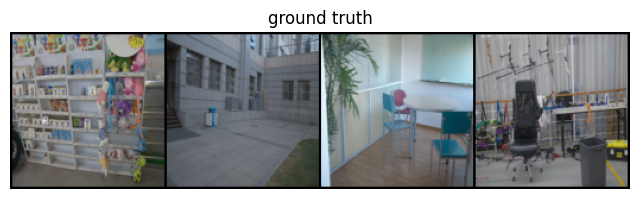

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

Step 300: loss: 0.19473


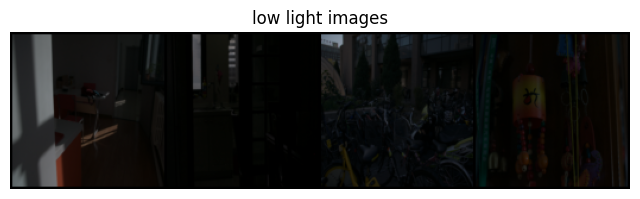

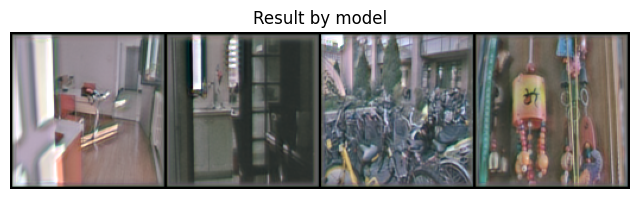

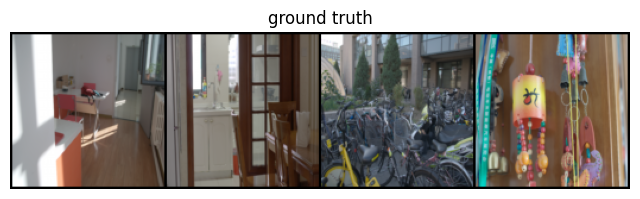

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

Step 400: loss: 0.18578


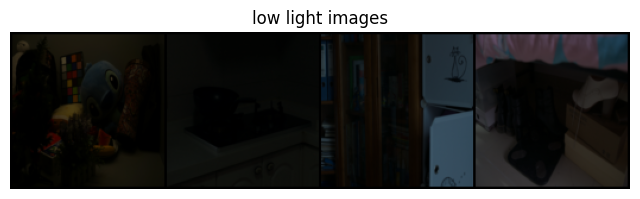

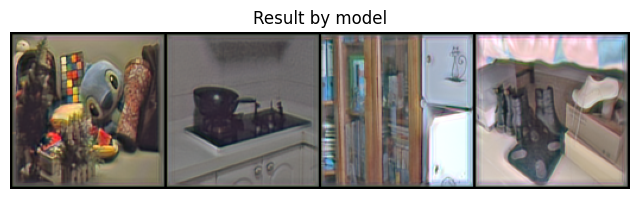

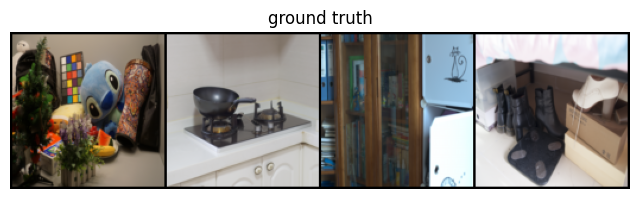

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

Step 500: loss: 0.17773


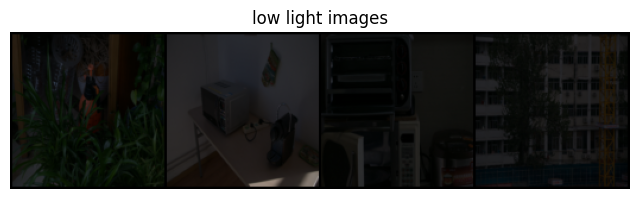

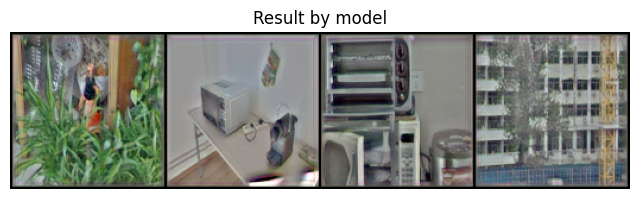

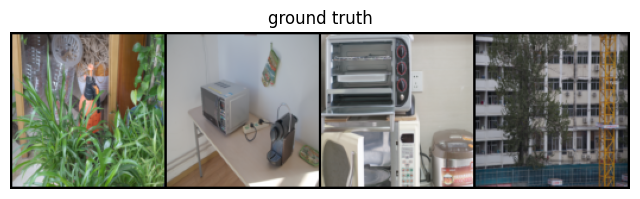

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

Step 600: loss: 0.16840


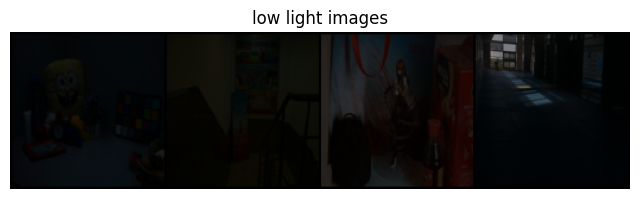

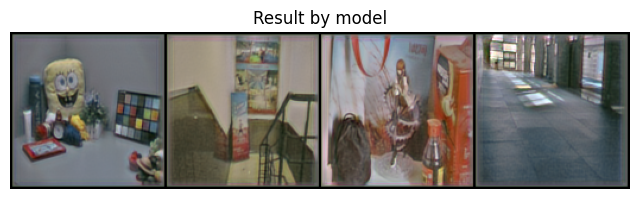

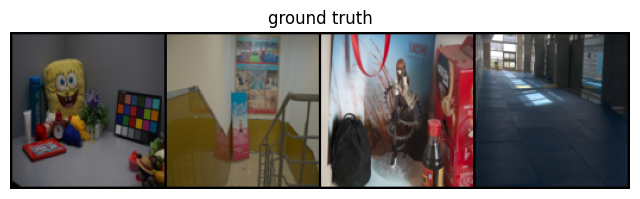

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

Step 700: loss: 0.16589


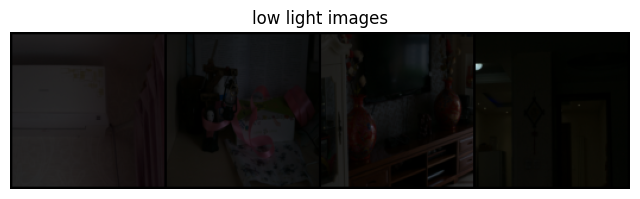

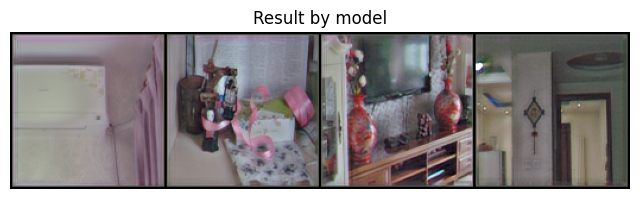

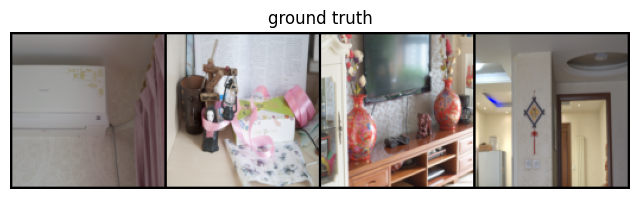

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

Step 800: loss: 0.15945


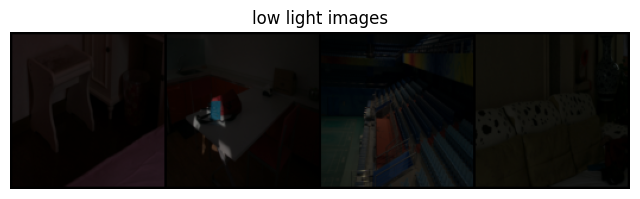

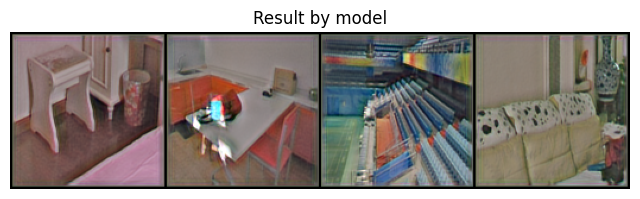

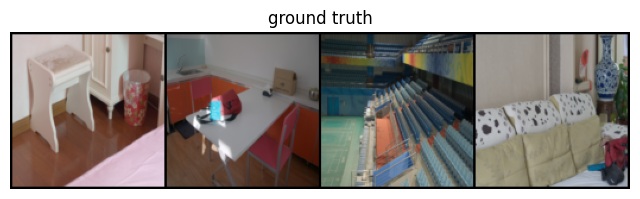

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

Step 900: loss: 0.15634


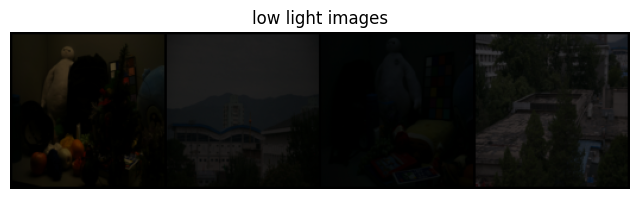

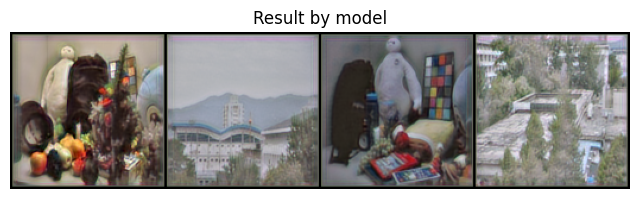

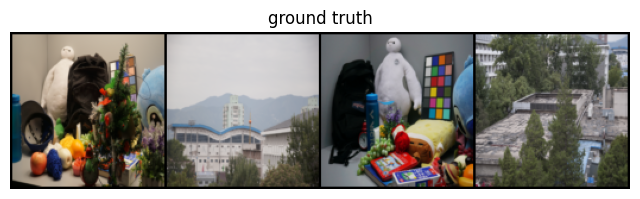

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

Step 1000: loss: 0.15463


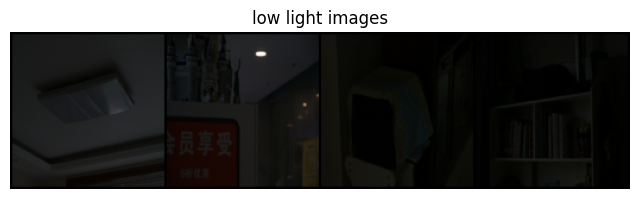

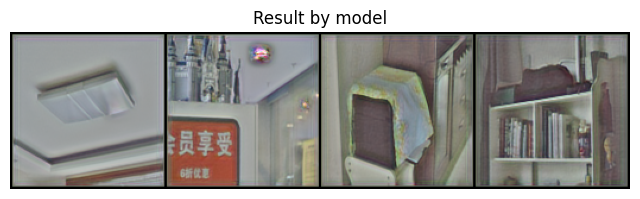

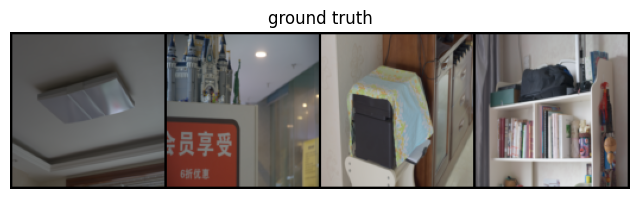

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

Step 1100: loss: 0.15172


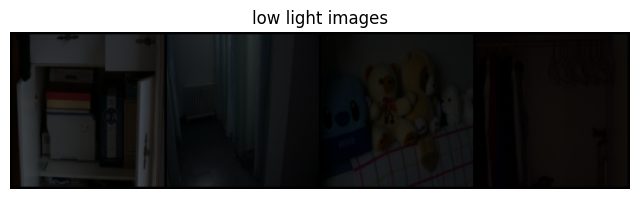

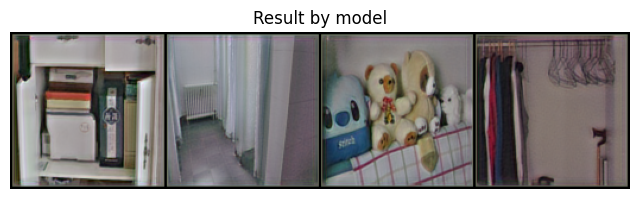

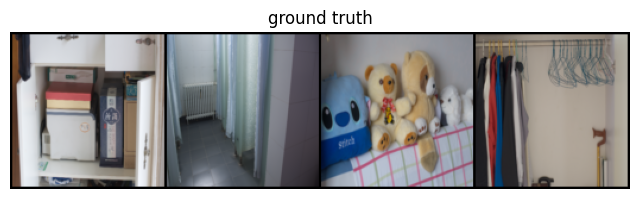

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

Step 1200: loss: 0.14945


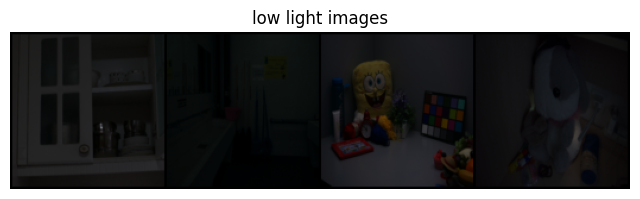

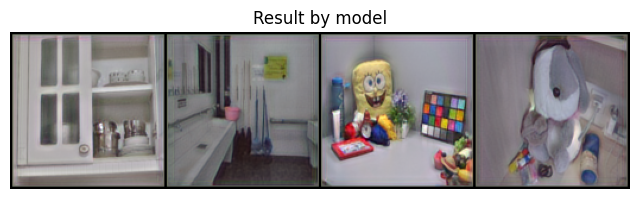

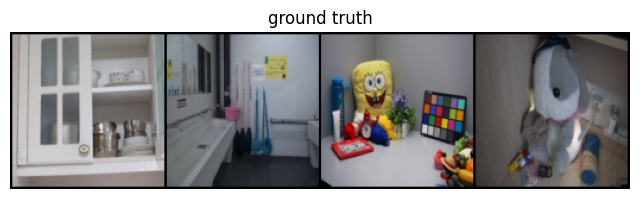

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

Step 1300: loss: 0.14789


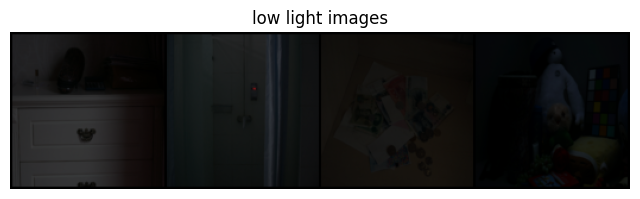

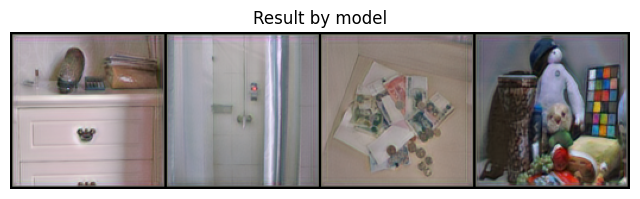

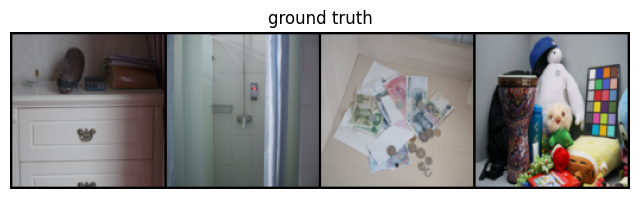

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

Step 1400: loss: 0.14667


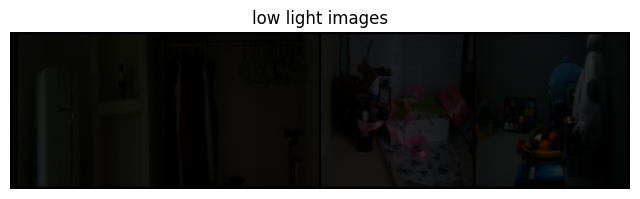

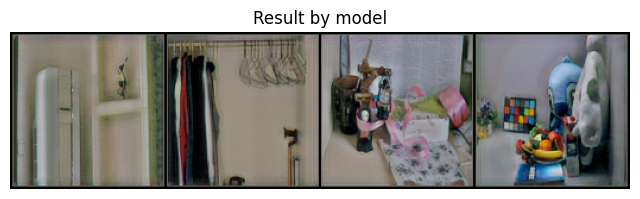

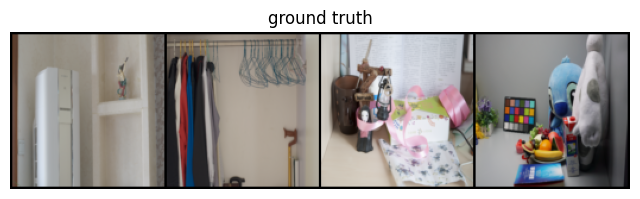

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

Step 1500: loss: 0.14629


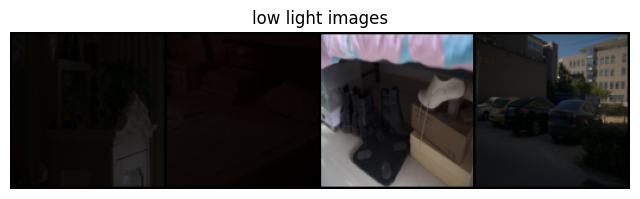

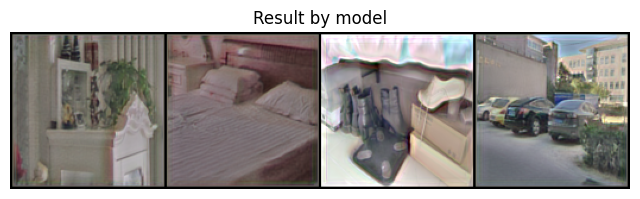

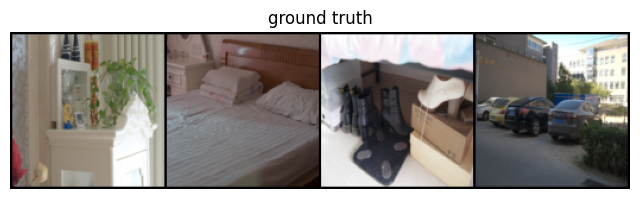

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

Step 1600: loss: 0.14279


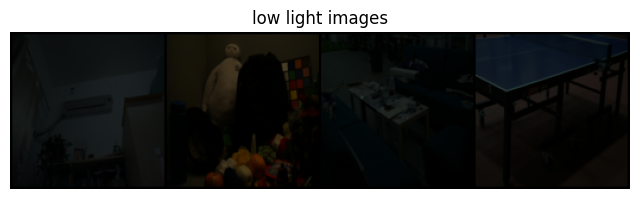

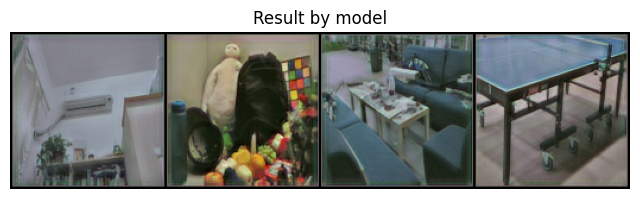

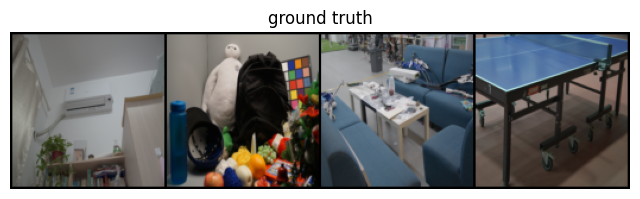

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

Step 1700: loss: 0.14342


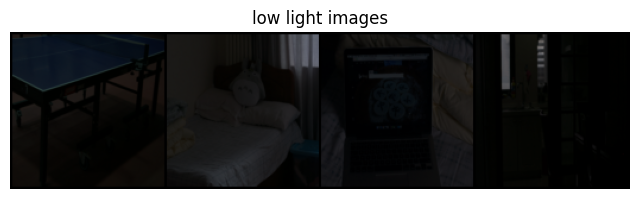

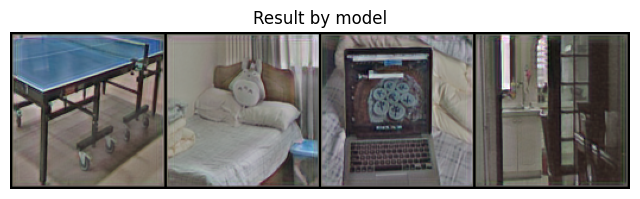

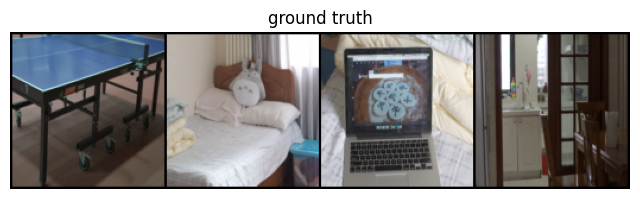

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

Step 1800: loss: 0.14169


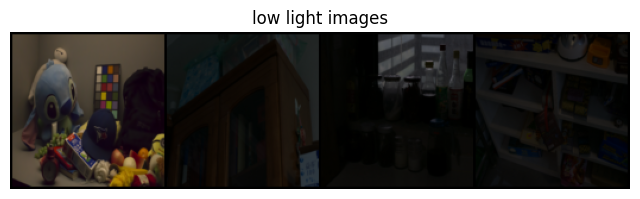

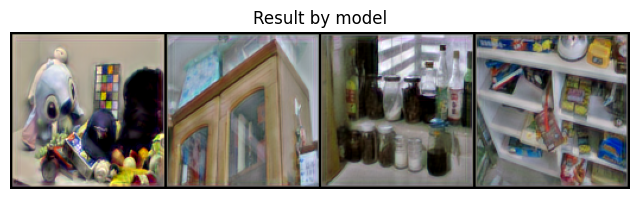

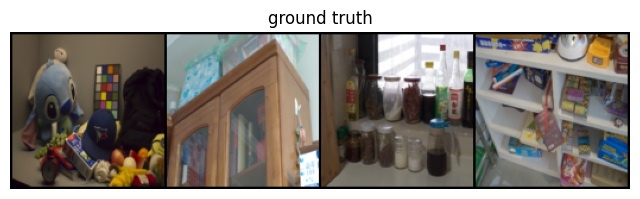

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

Step 1900: loss: 0.14137


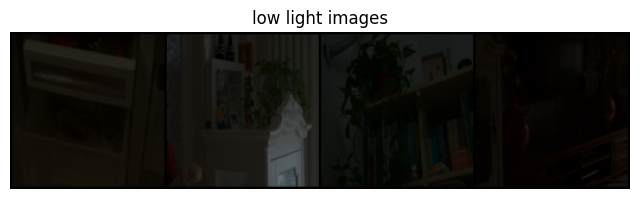

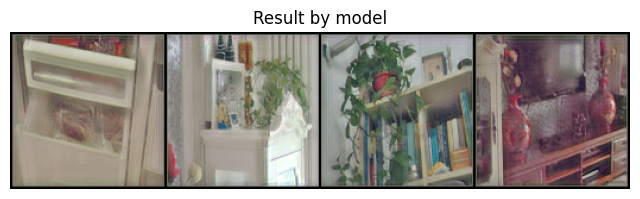

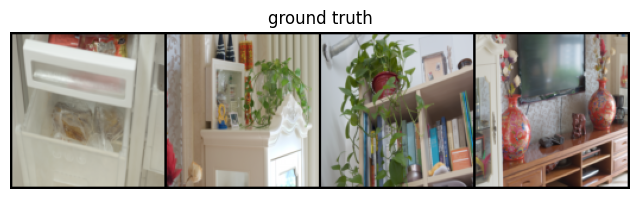

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

Step 2000: loss: 0.14062


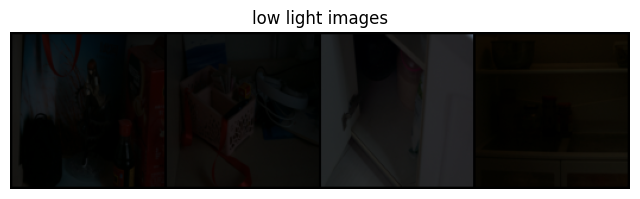

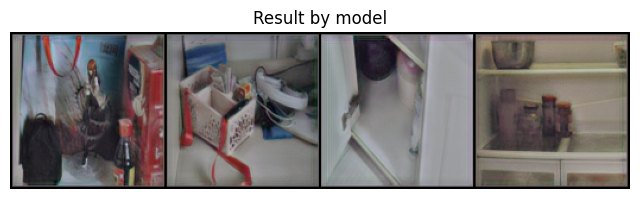

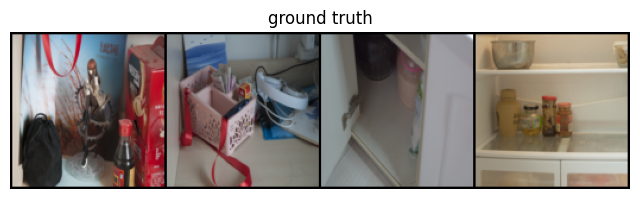

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

Step 2100: loss: 0.14102


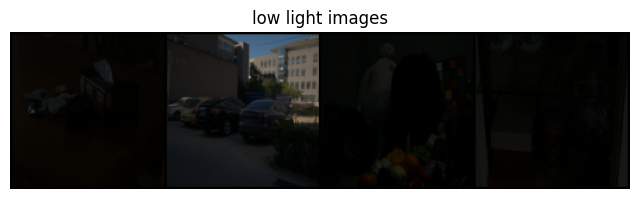

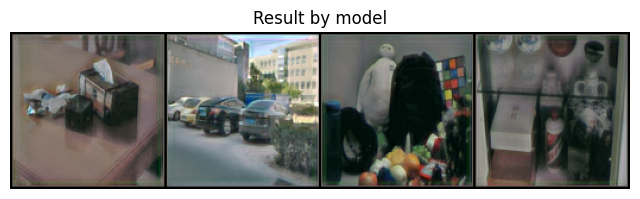

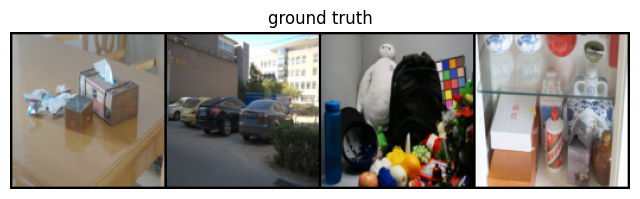

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

Step 2200: loss: 0.13804


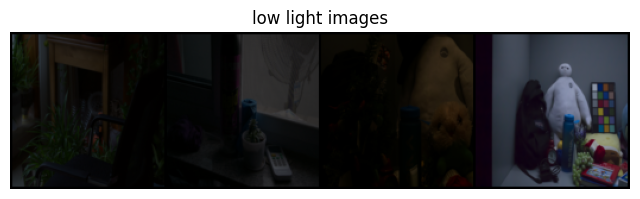

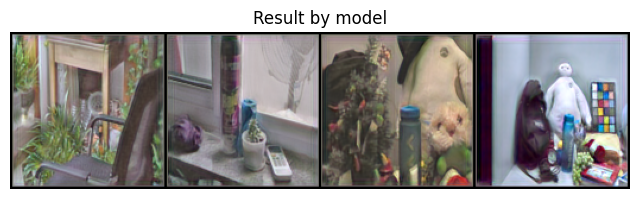

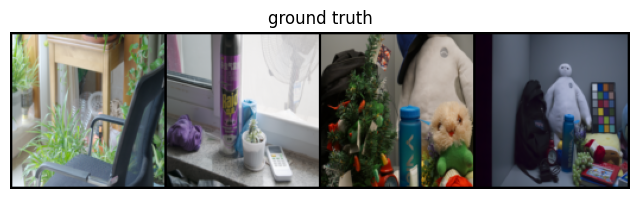

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

Step 2300: loss: 0.13715


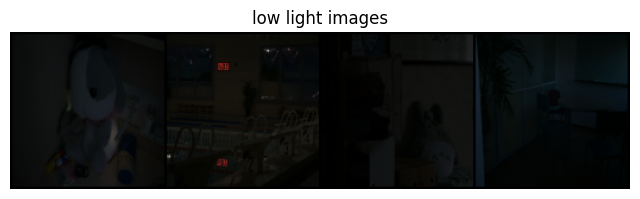

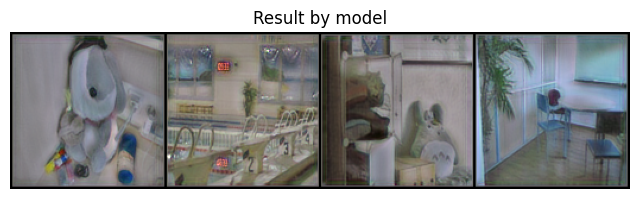

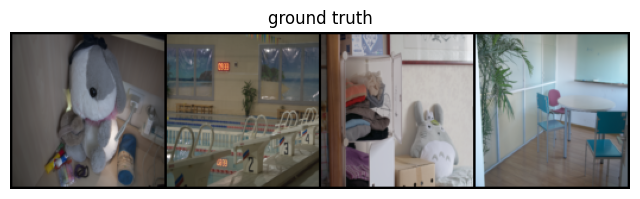

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

Step 2400: loss: 0.13557


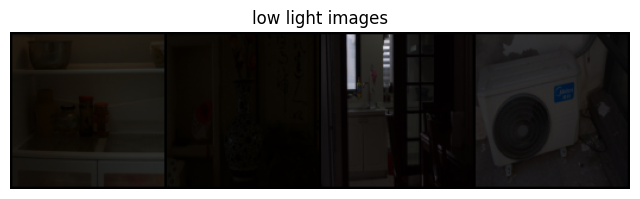

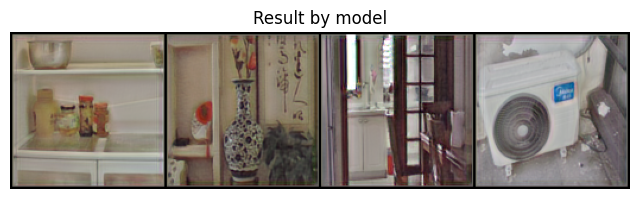

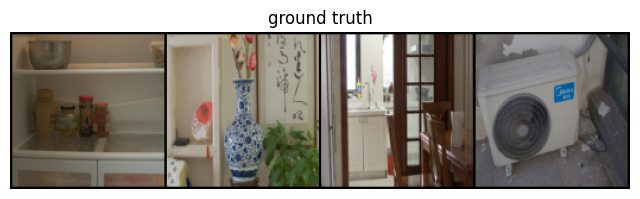

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

Step 2500: loss: 0.13368


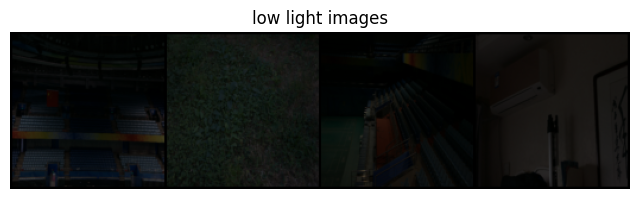

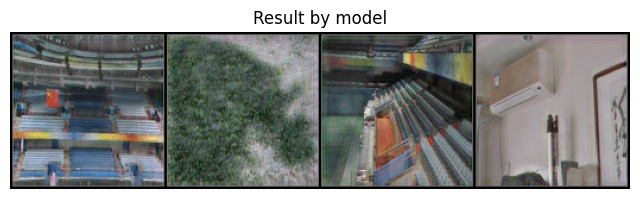

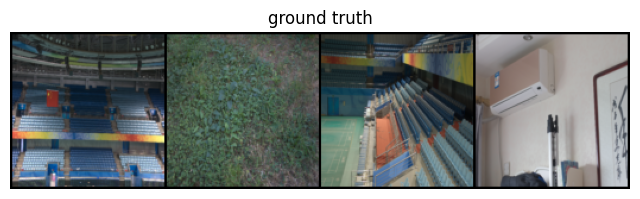

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

Step 2600: loss: 0.13230


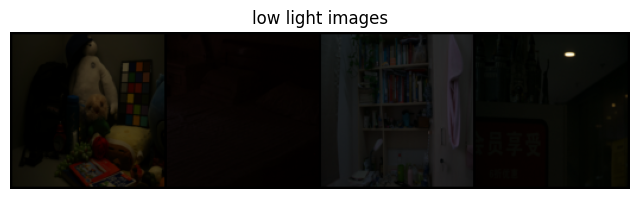

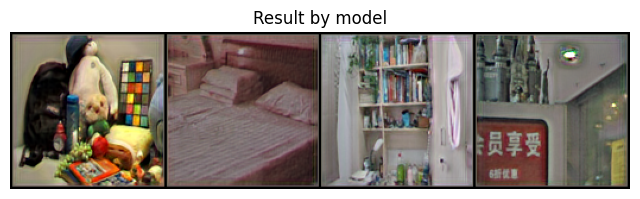

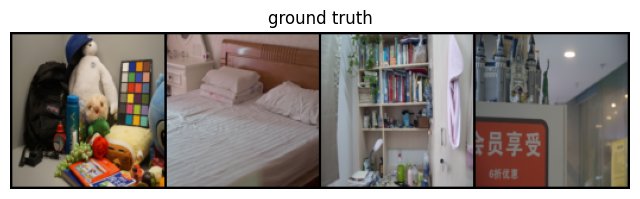

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

Step 2700: loss: 0.13338


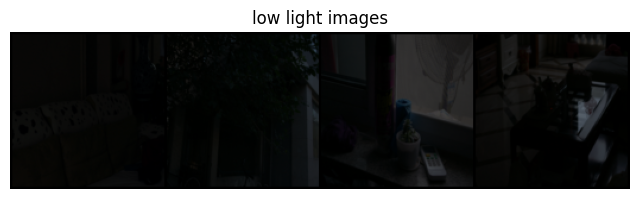

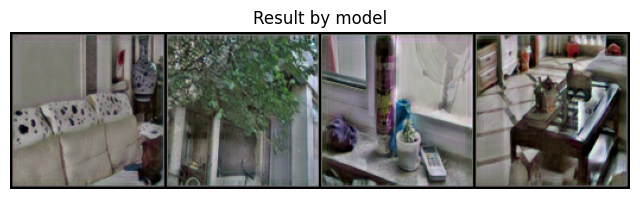

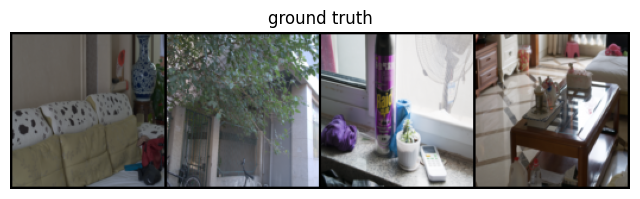

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

Step 2800: loss: 0.13342


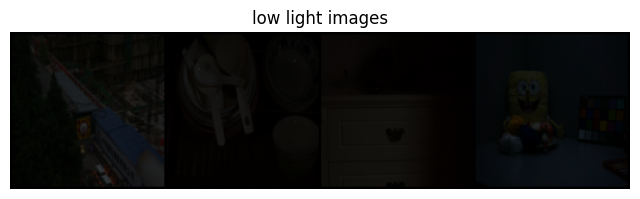

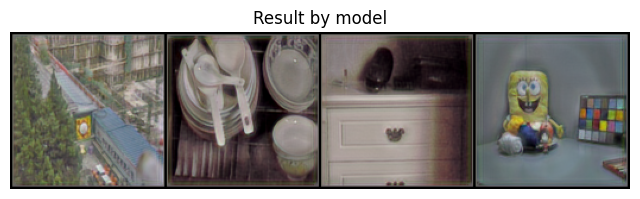

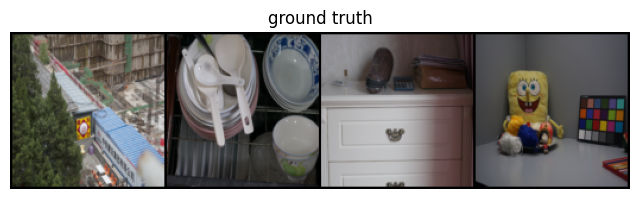

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

Step 2900: loss: 0.13050


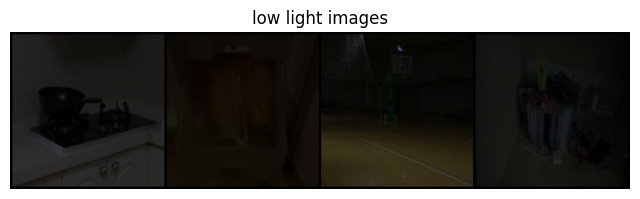

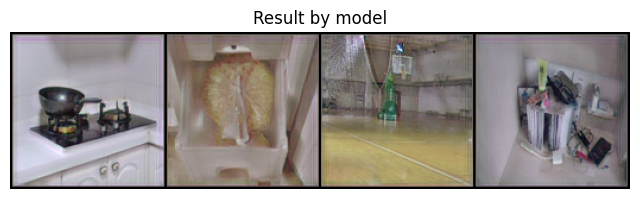

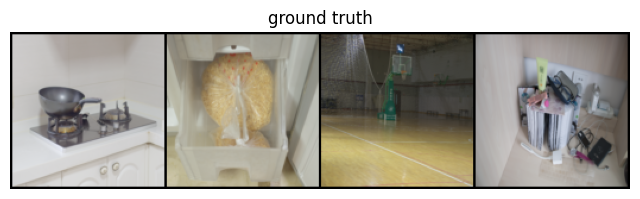

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

Step 3000: loss: 0.13002


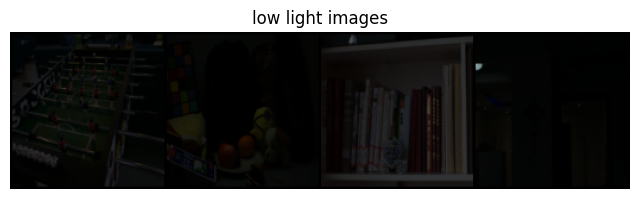

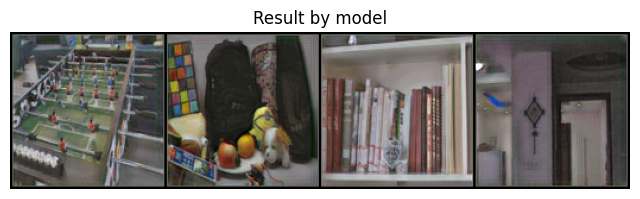

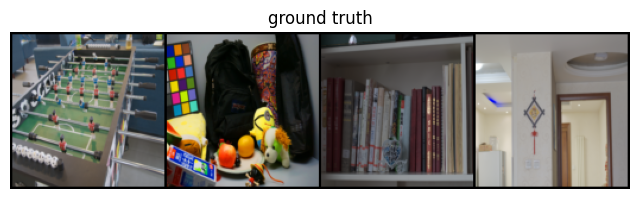

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

In [ ]:
import skimage
from skimage import io
model = model.to(device).train()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
total_steps=3.1e3
cur_step = 0
mean_loss = 0.0



def show_tensor_images(image_tensor,title=""):
    #image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:4], nrow=4)
    plt.figure(figsize=(8,10))
    plt.axis('off')
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.title(title)
    plt.show()
while cur_step < total_steps:
        for h_img, l_img in tqdm(dataloader, position=0):
            h_img = h_img.to(device)
            l_img = l_img.to(device)
            
            with torch.cuda.amp.autocast(enabled=(device=='cuda')):
                h_pred = model(l_img)
                #img_loss =1 - ssim(h_pred.to(h_img.dtype), h_img, data_range=1, size_average=True)
                img_loss=F.mse_loss(h_pred,h_img)
                pixel_loss_fn= nn.L1Loss()
                pixel_loss=pixel_loss_fn(h_img.to('cuda'),h_pred.to('cuda'))
                percep_loss=PerceptualLoss()
                percep=percep_loss(h_pred,h_img)
                loss=img_loss+pixel_loss+percep/3

            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            mean_loss += loss.item() / 100

            if cur_step % 100 == 0 and cur_step > 0:
                print('Step {}: loss: {:.5f}'.format(cur_step, mean_loss))
                show_tensor_images(l_img,title="low light images")
                show_tensor_images(h_pred.to(h_img.dtype),title="Result by model")
                show_tensor_images(h_img,title="ground truth")
                mean_loss = 0.0

            cur_step += 1
            if cur_step == total_steps:
                break

In [ ]:

filepath = "my_model.pth"
torch.save(model.state_dict(), filepath)


In [ ]:
from PIL import Image

image = Image.open('/content/LOL/eval15/low/111.png')

In [ ]:
input_tensor = data_transforms(image).unsqueeze(0).to(device)

In [ ]:

model.eval()
with torch.no_grad():
    output = model(input_tensor)


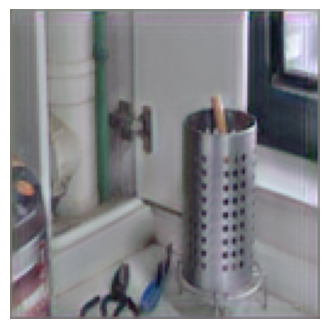

In [ ]:
output=output[0].detach().cpu()
plt.figure(figsize=(4,5))
plt.axis('off')
plt.imshow(output.permute(1,2,0))
plt.savefig('/content/111res.png')

In [ ]:
import cv2


gt_image = cv2.imread('/content/LOL/eval15/high/111.png')


pred_image = cv2.imread('/content/111res.png')


In [ ]:

gt_image_resized = cv2.resize(gt_image, (pred_image.shape[1], pred_image.shape[0]))

psnr = cv2.PSNR(gt_image_resized, pred_image)
print('PSNR:', psnr)


PSNR: 9.314564048194235


In [ ]:
from skimage.metrics import structural_similarity as ssim
ssim_value = ssim(gt_image_resized, pred_image, multichannel=True)

print('SSIM:', ssim_value)


SSIM: 0.4654978911233019


<ipython-input-63-9d556613d9c0>:2: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  ssim_value = ssim(gt_image_resized, pred_image, multichannel=True)


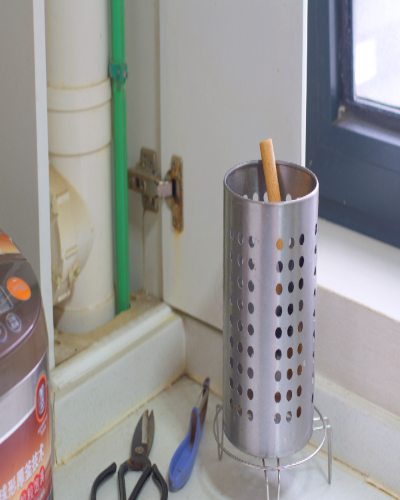

In [ ]:
from google.colab.patches import cv2_imshow
cv2_imshow(gt_image_resized)

In [ ]:
pred_image.shape

(500, 400, 3)